# Sheet properties

In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [3]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [22]:
%matplotlib inline
# produce vector inline graphics
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')
import matplotlib.pyplot as plt

# Start with local

In [5]:
import sys
from IPython.display import HTML
sys.path.append('/home/rcendre/classification')

# Imports

In [6]:
import webbrowser
from pathlib import Path
from IPython.display import display
from numpy import array, logspace
from misvm import SIL, MISVM
from scipy.stats import randint as randint
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.svm import SVC
from toolbox.classification.common import Data, Folds, IO, Tools
from toolbox.classification.parameters import Dermatology, Settings
from toolbox.IO import dermatology
from toolbox.transforms.common import PredictorTransform, FlattenTransform
from toolbox.transforms.labels import OrderedEncoder
from toolbox.views.common import Views, ViewsTools
from toolbox.views.images import ImagesViews, PatchViews
from toolbox.models.models import CustomMIL

Using TensorFlow backend.


# Parameters

In [7]:
# Advanced parameters
data_type = 'Full'
validation = 4
statistics = Dermatology.get_statistics_keys()
settings = Settings.get_default_dermatology()

In [16]:
malignant_encoder = OrderedEncoder().fit(['Healthy', 'Benign', 'Malignant'])
diagnosis_encoder = OrderedEncoder().fit(['Benign', 'Malignant'])

In [9]:
extractor_name = 'InceptionResNetV2'

# Inputs

In [10]:
file = f'Transfer_{data_type}.pickle'
inputs = IO.load(file)
inputs = inputs[(inputs['Binary_Diagnosis'] == 'Benign') |(inputs['Binary_Diagnosis'] == 'Malignant')].reset_index(drop=True)
inputs_first = inputs['ImageID'] == '0M'

In [11]:
all_file = f'All_Transfer_{data_type}.pickle'
all_inputs = IO.load(all_file)
all_inputs = all_inputs[(all_inputs['Binary_Diagnosis'] == 'Benign') |(all_inputs['Binary_Diagnosis'] == 'Malignant')].reset_index(drop=True)
all_inputs_first = all_inputs['ImageID'] == '0M'

# Samples statistics

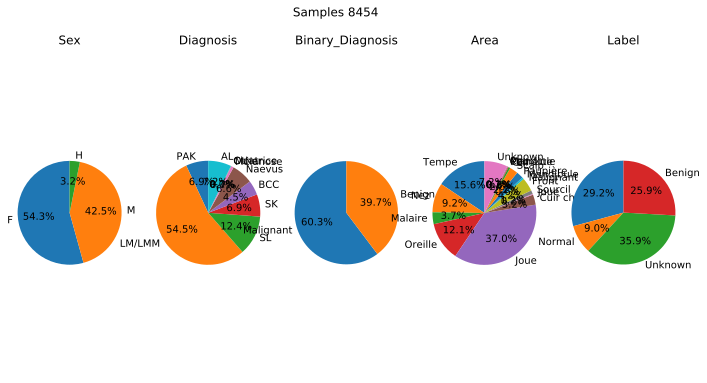

In [28]:
# ViewsTools.plot_size((12, 6))
# Views.statistics(inputs, statistics);

ViewsTools.plot_size((12, 6))
Views.statistics(all_inputs, statistics);

# Label / Group / Fold

In [13]:
# Transform labels
Tools.transform(inputs, {'datum': 'Binary_Diagnosis'}, diagnosis_encoder, 'DiagnosisEncode')
# Transform groups
group_encoder = LabelEncoder().fit(array(inputs['ID'].tolist()))
Tools.transform(inputs, {'datum': 'ID'}, group_encoder, 'GroupEncode')
# Make folds
Folds.build_group_folds(inputs, {'datum': 'Datum', 'label_encode': 'DiagnosisEncode', 'group': 'GroupEncode'}, validation)

In [14]:
# Transform labels
Tools.transform(all_inputs, {'datum': 'Binary_Diagnosis'}, diagnosis_encoder, 'DiagnosisEncode')
# Transform groups
group_encoder = LabelEncoder().fit(array(all_inputs['ID'].tolist()))
Tools.transform(all_inputs, {'datum': 'ID'}, group_encoder, 'GroupEncode')
# Make folds
Folds.build_group_folds(all_inputs, {'datum': 'Datum', 'label_encode': 'DiagnosisEncode', 'group': 'GroupEncode'}, validation)

In [23]:
# Views.fold_visualization(inputs, {'label_encode': 'DiagnosisEncode', 'group_encode': 'GroupEncode'}, diagnosis_encoder, settings);
Views.fold_visualization(all_inputs, {'label_encode': 'DiagnosisEncode', 'group_encode': 'GroupEncode'}, diagnosis_encoder, settings);

# Model evaluation

## Models

In [24]:
models = []
models.append(('SIL', 
               CustomMIL(SIL(kernel='linear', C=1.0, verbose=False)),
               {'estimator__C': logspace(-2, 3, 6).tolist()}))
models.append(('MISVM', 
               CustomMIL(MISVM(kernel='linear', C=1.0, verbose=False)),
               {'estimator__C': logspace(-2, 3, 6).tolist()}))

## Evaluation

In [25]:
weak_file = f'Weak_Transfer_{data_type}.pickle'
weak_all_file = f'Weak_All_Transfer_{data_type}.pickle'

In [ ]:
# Simple labels
Tools.fit_predict(inputs, {'datum': extractor_name, 'label_encode': 'DiagnosisEncode'}, StandardScaler(), 'Scaling')
Data.build_bags(inputs, inputs_first, 'ID', [True] * len(inputs.index), 'ID', f'Scaling')

for model in models:
    model_name, model_kernel,model_params = model
    # MIL evaluation
    Tools.evaluate(inputs, {'datum': f'Scaling', 'label_encode': 'DiagnosisEncode'}, model_kernel, model_name, grid=model_params, mask=inputs_first)

# Save
IO.save(inputs, weak_file)

In [ ]:
# All labels
Tools.fit_predict(all_inputs, {'datum': extractor_name, 'label_encode': 'DiagnosisEncode'}, StandardScaler(), 'Scaling')
Data.build_bags(all_inputs, all_inputs_first, 'ID', [True] * len(all_inputs.index), 'ID', f'Scaling')

for model in models:
    model_name, model_kernel,model_params = model
    # MIL evaluation
    Tools.evaluate(all_inputs, {'datum': f'Scaling', 'label_encode': 'DiagnosisEncode'}, model_kernel, model_name, grid=model_params, mask=all_inputs_first)

# Save
IO.save(all_inputs, weak_all_file)

In [26]:
inputs = IO.load(weak_file)
all_inputs = IO.load(weak_all_file)

# Analysis

## Scores and ROC

In [ ]:
# ROC Curve
ViewsTools.plot_size((8,8))
    
for model in models:  
    # Decompose model
    model_name, model_process, model_params = model        
    
    # Label
    display(Views.details(ViewsTools.data_as(inputs[inputs_first], model_name), {'eval': model_name}))
    display(HTML(ViewsTools.dataframe_renderer([Views.report(ViewsTools.data_as(inputs[inputs_first], model_name), {'label_encode': 'DiagnosisEncode', 'eval': model_name}, diagnosis_encoder),
                                Views.report(ViewsTools.data_as(inputs[inputs_first], model_name, as_train=True), {'label_encode': 'DiagnosisEncode', 'eval': model_name}, diagnosis_encoder)],
                                title=[f'Test - {model_name}', f'Train - {model_name}'])))
    Views.receiver_operator_curves(ViewsTools.data_as(inputs[inputs_first], model_name), diagnosis_encoder, {'label_encode': 'DiagnosisEncode', 'eval': model_name}, settings);


,Fold,Features,Parameters
0,1,0,{'estimator__C': 1.0}
1,2,0,{'estimator__C': 1.0}
2,3,0,{'estimator__C': 1.0}
3,4,0,{'estimator__C': 10.0}


,f1-score,precision,recall,support
Benign,0.49±0.06,0.97±0.05,0.33±0.05,113.00±4.82
Malignant,0.78±0.05,0.64±0.06,0.99±0.01,138.00±5.22
micro avg,0.69±0.04,0.69±0.04,0.69±0.04,251.00±2.17
macro avg,0.64±0.03,0.81±0.05,0.66±0.03,251.00±2.17
weighted avg,0.65±0.04,0.79±0.03,0.69±0.04,251.00±2.17
,f1-score,precision,recall,support
Benign,0.52±0.09,1.00±0.00,0.35±0.08,339.00±14.45
Malignant,0.79±0.04,0.65±0.06,1.00±0.00,414.00±15.66
micro avg,0.71±0.04,0.71±0.04,0.71±0.04,753.00±6.50
macro avg,0.65±0.05,0.83±0.03,0.68±0.04,753.00±6.50


,Fold,Features,Parameters
0,1,0,{'estimator__C': 10.0}
1,2,0,{'estimator__C': 1.0}
2,3,0,{'estimator__C': 1.0}
3,4,0,{'estimator__C': 10.0}


,f1-score,precision,recall,support
Benign,0.81±0.04,0.78±0.06,0.84±0.08,113.00±4.82
Malignant,0.83±0.02,0.86±0.07,0.80±0.05,138.00±5.22
micro avg,0.82±0.02,0.82±0.02,0.82±0.02,251.00±2.17
macro avg,0.82±0.02,0.82±0.03,0.82±0.02,251.00±2.17
weighted avg,0.82±0.02,0.82±0.02,0.82±0.02,251.00±2.17
,f1-score,precision,recall,support
Benign,0.91±0.02,0.88±0.04,0.94±0.04,339.00±14.45
Malignant,0.92±0.02,0.95±0.02,0.89±0.05,414.00±15.66
micro avg,0.91±0.02,0.91±0.02,0.91±0.02,753.00±6.50
macro avg,0.91±0.01,0.91±0.01,0.92±0.01,753.00±6.50


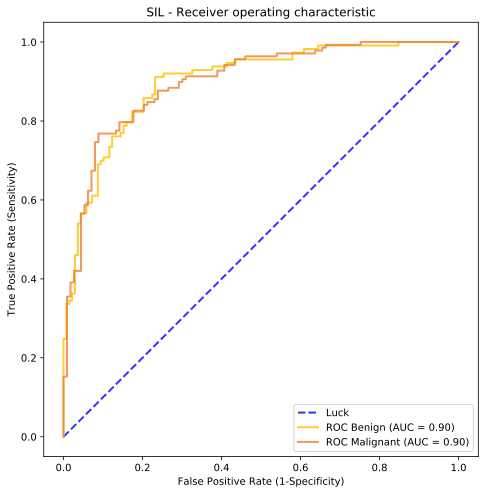

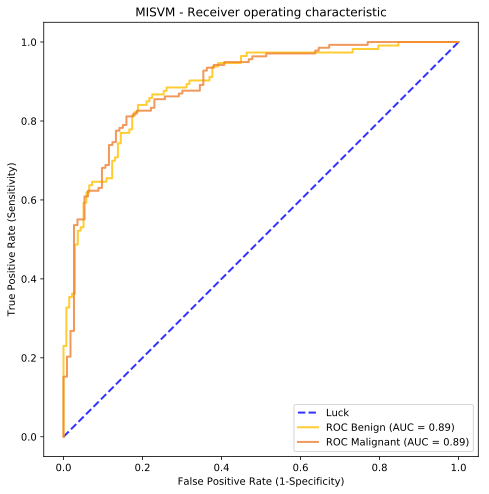

In [27]:
# ROC Curve
ViewsTools.plot_size((8,8))
    
for model in models:  
    # Decompose model
    model_name, model_process, model_params = model        
    
    #Label
    display(Views.details(ViewsTools.data_as(all_inputs[all_inputs_first], model_name), {'eval': model_name}))
    display(HTML(ViewsTools.dataframe_renderer([Views.report(ViewsTools.data_as(all_inputs[all_inputs_first], model_name), {'label_encode': 'DiagnosisEncode', 'eval': model_name}, diagnosis_encoder),
                                Views.report(ViewsTools.data_as(all_inputs[all_inputs_first], model_name, as_train=True), {'label_encode': 'DiagnosisEncode', 'eval': model_name}, diagnosis_encoder)],
                                title=[f'Test - {model_name}', f'Train - {model_name}'])))   
    Views.receiver_operator_curves(ViewsTools.data_as(all_inputs[all_inputs_first], model_name), diagnosis_encoder, {'label_encode': 'DiagnosisEncode', 'eval': model_name}, settings);